In [22]:
import pandas as pd
import numpy as np
import os

In [2]:
train = pd.read_csv("../dataset/train.csv")
test = pd.read_csv("../dataset/test.csv")
building  = pd.read_csv("../dataset/building_info.csv", encoding="CP949")
submission = pd.read_csv("../dataset/sample_submission.csv")
train['일시'] = train['일시'].apply(lambda x: pd.to_datetime(x))

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   num_date_time  204000 non-null  object        
 1   건물번호           204000 non-null  int64         
 2   일시             204000 non-null  datetime64[ns]
 3   기온(C)          204000 non-null  float64       
 4   강수량(mm)        43931 non-null   float64       
 5   풍속(m/s)        203981 non-null  float64       
 6   습도(%)          203991 non-null  float64       
 7   일조(hr)         128818 non-null  float64       
 8   일사(MJ/m2)      116087 non-null  float64       
 9   전력소비량(kWh)     204000 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(1)
memory usage: 15.6+ MB


In [4]:
train = train.sort_values('일시')

train['datetime'] = train['일시'].copy()
train.set_index(train['datetime'], inplace=True)
train = train.drop(['datetime'], axis=1)

train['강수량(mm)'] = train['강수량(mm)'].interpolate(method='time')
train['풍속(m/s)'] = train['풍속(m/s)'].interpolate(method='time')
train['습도(%)'] = train['습도(%)'].interpolate(method='time')
train['일조(hr)'] = train['일조(hr)'].interpolate(method='time')
train['일사(MJ/m2)'] = train['일사(MJ/m2)'].interpolate(method='time')

train = train.dropna()
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 203986 entries, 2022-06-01 00:00:00 to 2022-08-24 23:00:00
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   num_date_time  203986 non-null  object        
 1   건물번호           203986 non-null  int64         
 2   일시             203986 non-null  datetime64[ns]
 3   기온(C)          203986 non-null  float64       
 4   강수량(mm)        203986 non-null  float64       
 5   풍속(m/s)        203986 non-null  float64       
 6   습도(%)          203986 non-null  float64       
 7   일조(hr)         203986 non-null  float64       
 8   일사(MJ/m2)      203986 non-null  float64       
 9   전력소비량(kWh)     203986 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(1)
memory usage: 17.1+ MB


In [5]:
import plotly.express as px

fig = px.line(train, x='일시', y='전력소비량(kWh)', color='건물번호')
fig.show()

In [6]:
from sklearn.preprocessing import MinMaxScaler

y_scaler = MinMaxScaler()
x_scalers = [MinMaxScaler() for _ in range(6)]

y_scaler.fit(train['전력소비량(kWh)'].to_numpy().reshape(-1,1))
train['전력소비량(kWh)'] = y_scaler.transform(train['전력소비량(kWh)'].to_numpy().reshape(-1,1))

for i,x_scaler in enumerate(x_scalers):
    x_scaler.fit(train.iloc[:,i+3].to_numpy().reshape(-1,1))
    train.iloc[:,i+3] = x_scaler.transform(train.iloc[:,i+3].to_numpy().reshape(-1,1))

In [29]:
from torch.utils.data import DataLoader, Dataset

class windowDataset(Dataset):
    def __init__(self, y, input_window=80, output_window=20, stride=5):
        #총 데이터의 개수
        L = y.shape[0]
        #stride씩 움직일 때 생기는 총 sample의 개수
        num_samples = (L - input_window - output_window) // stride + 1

        #input과 output
        X = np.zeros([input_window, num_samples])
        Y = np.zeros([output_window, num_samples])

        for i in np.arange(num_samples):
            start_x = stride*i
            end_x = start_x + input_window
            X[:,i] = y[start_x:end_x]

            start_y = stride*i + input_window
            end_y = start_y + output_window
            Y[:,i] = y[start_y:end_y]
        print(X.shape, Y.shape)

        X = X.reshape(X.shape[0], X.shape[1], 1).transpose((1,0,2))
        print(X.shape)
        Y = Y.reshape(Y.shape[0], Y.shape[1], 1).transpose((1,0,2))
        print(Y.shape)
        self.x = X
        self.y = Y
        
        self.len = len(X)
    def __getitem__(self, i):
        return self.x[i], self.y[i, :-1], self.y[i,1:]
    def __len__(self):
        return self.len

In [30]:
iw = 24*2
ow = 24*1

train_dataset = windowDataset(train['전력소비량(kWh)'], input_window=iw, output_window=ow, stride=1)
train_loader = DataLoader(train_dataset, batch_size=64)

(48, 203915) (24, 203915)
(203915, 48, 1)
(203915, 24, 1)


In [25]:
x, y, z = train_dataset[0]
print(x.shape, y.shape, z.shape)

(48, 1) (23, 1) (23, 1)


In [9]:
from torch.nn import Transformer
from torch import nn
import torch
import math

In [10]:
class TFModel(nn.Module):
    def __init__(self,d_model, n_head, d_hidden, n_layer, dropout=0.5):
        super(TFModel, self).__init__()
        self.transformer = Transformer(
            d_model=d_model, 
            n_head=n_head, 
            dim_feedforward=d_hidden, 
            num_encoder_layers=n_layer, 
            num_decoder_layers=n_layer,
            dropout=dropout)
        self.pos_encoder = PositionalEncoding(d_model, dropout)
        self.pos_encoder_d = PositionalEncoding(d_model, dropout)
        self.linear = nn.Linear(d_model, 1)
        self.encoder = nn.Linear(1, d_model)
        self.encoder_d = nn.Linear(1, d_model)

    def generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)    # 1로 이루어진 하 삼각행렬
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def forward(self, src, tgt, srcmask, tgtmask):
        src = self.encoder(src)     # to encoder, get d_model vector
        src = self.pos_encoder(src) 

        tgt = self.encoder_d(tgt)   # to decoder, get d_model vector
        tgt = self.pos_encoder_d(tgt)
        output = self.transformer(src.transpose(0,1), tgt.transpose(0,1), srcmask, tgtmask)
        output = self.linear(output)
        return output

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

def gen_attention_mask(x):
    mask = torch.eq(x, 0)
    return mask

# NOTE: 결측치는 [PAD] 마스크로 처리해도 좋을 듯 

In [11]:
torch.cuda.is_available()

True

In [12]:
device = torch.device("cuda")

lr = 1e-3
d_model = 256
n_head = 8
d_hidden = 2
n_layer = 2

model = TFModel(d_model, n_head, d_hidden, n_layer, dropout=0.1).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [14]:
epoch = 20
from tqdm import tqdm

model.train()
progress = tqdm(range(epoch))
for i in progress:
    batchloss = 0.0
    
    for (inputs, dec_inputs, outputs) in train_loader:
        optimizer.zero_grad()
        src_mask = model.generate_square_subsequent_mask(inputs.shape[1]).to(device)
        tgt_mask = model.generate_square_subsequent_mask(dec_inputs.shape[1]).to(device)

        result = model(inputs.float().to(device), dec_inputs.float().to(device), src_mask, tgt_mask)
        loss = criterion(result.permute(1,0,2), outputs.float().to(device))
        
        loss.backward()
        optimizer.step()
        batchloss += loss
    progress.set_description("{:0.5f}".format(batchloss.cpu().item() / len(train_loader)))

0.00931: 100%|██████████| 20/20 [26:24<00:00, 79.22s/it]


In [85]:
length = 24*2
tgt = torch.tensor(train['전력소비량(kWh)'][-length*2: -1]).reshape(1,-1,1).float().to(device)
tgt.shape, tgt[:,:-1,:].shape

(torch.Size([1, 95, 1]), torch.Size([1, 94, 1]))

In [102]:
def evaluate(length):
    src = torch.tensor(train['전력소비량(kWh)'][-length*2:]).reshape(1,-1,1).float().to(device)
    tgt = torch.tensor(train['전력소비량(kWh)'][-1]).reshape(1,-1,1).float().to(device)
    model.eval()
    for i in range(length):
        src_mask = model.generate_square_subsequent_mask(src.shape[1]).to(device)
        tgt_mask = model.generate_square_subsequent_mask(tgt.shape[1]).to(device)

        predictions = model(src, tgt, src_mask, tgt_mask).transpose(0,1)
        predictions = predictions[:, -1:, :]
        tgt = torch.cat([tgt, predictions.to(device)], axis=1)
    return torch.squeeze(tgt, axis=0).detach().cpu().numpy()[1:]

In [103]:
result = evaluate(24*7)
result = y_scaler.inverse_transform(result)
real = train['전력소비량(kWh)'].to_numpy()
real = y_scaler.inverse_transform(real.reshape(-1,1))

In [104]:
result.shape

(168, 1)

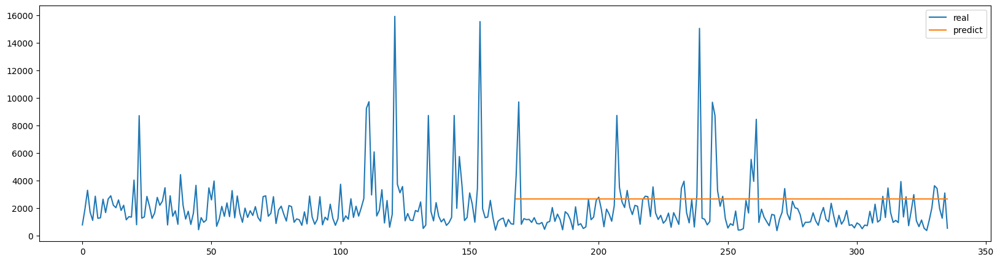

In [107]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,5))
plt.plot(range(0, 24*7*2),real[-result.shape[0]*2:], label="real")
plt.plot(range(24*7, 24*7*2),result, label="predict")
plt.legend()
plt.show()